# Analysis and Prediction of Covid-19

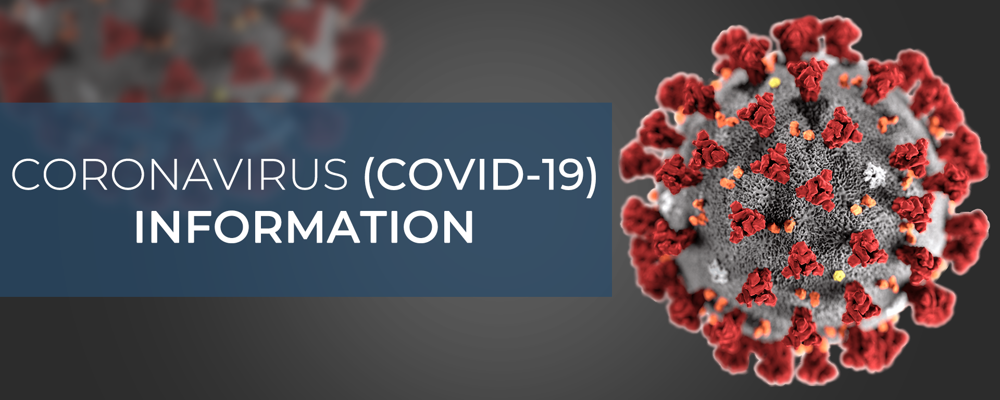

In [95]:
from IPython.display import Image
Image("covid19.png")

Coronaviruses are a large family of viruses which may cause illness in animals or humans. In humans, several coronaviruses are known to cause respiratory infections ranging from the common cold to more severe diseases such as Middle East Respiratory Syndrome (MERS) and Severe Acute Respiratory Syndrome (SARS). The most recently discovered coronavirus causes coronavirus disease COVID-19.COVID-19 is the infectious disease caused by the most recently discovered coronavirus. This new virus and disease were unknown before the outbreak began in Wuhan, China, in December 2019.


Goal:
To analyse and track the coronavirus outbreak and be aware of the actual stats that are affecting the areas that we live in and the whole world.Through this project we aim to perform an analyis on available data on COVID-19. We plan to use classifiers, unsupervised learning and forecasting to help arrive at our mentioned objectives.

### Objectives:
    1) Through our EDA, we are predicting the survival rate of individuals in USA and worldwide.
    2) The model with all the coefficients leading to death or even infection
    3) Prediction of the curve (when it is going to end and when it will flatten)
    4) To implement an unsupervised learning model (K-means clustering) to identify for underlying groups or categories
       existing in our data and gain possible insights.
    5) Best Forecasting model that would predict the optimal future trends.

### Target Audience:
     Researchers,Statisticians, hospitals, common people

The dataset has been collated from Johns Hopkins Github repository and we have utilised 2 level of csv files to identify Exploratory Data Analysis and perform statistical modelling on the coronavirus outbreak data. It has over 18000 records with 23 columns over a period of January to April 2020 used for further analysis. The columns provide the total number of cases as well detailed information on patients.

In [1]:
from IPython.core.display import HTML
HTML('''<div class="flourish-embed flourish-cards" data-src="visualisation/1810417" data-url="https://flo.uri.sh/visualisation/1810417/embed"><script src="https://public.flourish.studio/resources/embed.js"></script></div>''')

In [68]:
#pip install plotly
#pip install "notebook>=5.3" "ipywidgets>=7.2"
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import datetime as dt
from datetime import timedelta
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score,silhouette_samples
from sklearn.linear_model import LinearRegression,Ridge,Lasso
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error,r2_score
import statsmodels.api as sm
from statsmodels.tsa.api import Holt,SimpleExpSmoothing,ExponentialSmoothing
from sklearn.preprocessing import PolynomialFeatures
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.ar_model import AR
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
std=StandardScaler()
#pd.set_option('display.float_format', lambda x: '%.6f' % x)

# color pallette
cnf, dth, rec, act = '#393e46', '#ff2e63', '#21bf73', '#fe9801'

import matplotlib.dates as mdates
import plotly.express as px
from datetime import date, timedelta
from sklearn.cluster import KMeans
import plotly.offline as py
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import statsmodels.api as sm
from sklearn.preprocessing import MinMaxScaler

In [70]:
covid = pd.read_csv(r"C:/Users/ancna/OneDrive/Desktop/STATS_ML/covid_25thApr.csv")

In [3]:
covid.shape

(18327, 8)

In [4]:
covid.head(10)

,SNo,Date,States,Country,Last Update,Confirmed,Deaths,Recovered
0,1,1/22/2020,Anhui,Mainland China,1/22/2020 17:00,1,0,0
1,2,1/22/2020,Beijing,Mainland China,1/22/2020 17:00,14,0,0
2,3,1/22/2020,Chongqing,Mainland China,1/22/2020 17:00,6,0,0
3,4,1/22/2020,Fujian,Mainland China,1/22/2020 17:00,1,0,0
4,5,1/22/2020,Gansu,Mainland China,1/22/2020 17:00,0,0,0
5,6,1/22/2020,Guangdong,Mainland China,1/22/2020 17:00,26,0,0
6,7,1/22/2020,Guangxi,Mainland China,1/22/2020 17:00,2,0,0
7,8,1/22/2020,Guizhou,Mainland China,1/22/2020 17:00,1,0,0
8,9,1/22/2020,Hainan,Mainland China,1/22/2020 17:00,4,0,0
9,10,1/22/2020,Hebei,Mainland China,1/22/2020 17:00,1,0,0


In [5]:
parse_dates=['Date']

In [6]:
covid['Active'] = covid['Confirmed'] - covid['Deaths'] - covid['Recovered']

In [7]:
covid.head()

,SNo,Date,States,Country,Last Update,Confirmed,Deaths,Recovered,Active
0,1,1/22/2020,Anhui,Mainland China,1/22/2020 17:00,1,0,0,1
1,2,1/22/2020,Beijing,Mainland China,1/22/2020 17:00,14,0,0,14
2,3,1/22/2020,Chongqing,Mainland China,1/22/2020 17:00,6,0,0,6
3,4,1/22/2020,Fujian,Mainland China,1/22/2020 17:00,1,0,0,1
4,5,1/22/2020,Gansu,Mainland China,1/22/2020 17:00,0,0,0,0


In [8]:
covid.tail(10)

,SNo,Date,States,Country,Last Update,Confirmed,Deaths,Recovered,Active
18317,18318,4/24/2020,Virginia,US,4/25/2020 6:31,11594,411,0,11183
18318,18319,4/24/2020,Washington,US,4/25/2020 6:31,12977,722,0,12255
18319,18320,4/24/2020,West Virginia,US,4/25/2020 6:31,1010,32,0,978
18320,18321,4/24/2020,Western Australia,Australia,4/25/2020 6:31,548,8,340,200
18321,18322,4/24/2020,Wisconsin,US,4/25/2020 6:31,5356,263,0,5093
18322,18323,4/24/2020,Wyoming,US,4/25/2020 6:31,473,7,0,466
18323,18324,4/24/2020,Xinjiang,Mainland China,4/25/2020 6:31,76,3,73,0
18324,18325,4/24/2020,Yukon,Canada,4/25/2020 6:31,11,0,0,11
18325,18326,4/24/2020,Yunnan,Mainland China,4/25/2020 6:31,185,2,180,3
18326,18327,4/24/2020,Zhejiang,Mainland China,4/25/2020 6:31,1268,1,1256,11


In [9]:
covid[['States']] = covid[['States']].fillna('')
covid[['Confirmed', 'Deaths', 'Recovered', 'Active']] = covid[['Confirmed', 'Deaths', 'Recovered', 'Active']].fillna(0)

In [10]:
grouped = covid.groupby('Date')['Date', 'Confirmed', 'Deaths'].sum().reset_index()

In [11]:
grouped['Date'] =pd.to_datetime(grouped.Date)

In [12]:
grouped.sort_values(by=['Date'], inplace=True, ascending=True)

In [13]:
fig = px.line(grouped, x="Date", y="Confirmed", title="Worldwide Confirmed Cases Over Time")
fig.show()


Here we can see that exponential growth curve increase slowly in the beginning, but the gains increase rapidly later March 12th 2020.The slope of the line at the latest time frame is very high and it makes the situation even worse. 
The pandemic is still in its peak as per the data that is gathered.

In [14]:
covid['States'] = covid['States'].fillna('')
temp = covid[[col for col in covid.columns if col != 'States']]

In [15]:
latest = temp[temp['Date'] == max(temp['Date'])].reset_index()
latest_grouped = latest.groupby('Country')['Confirmed', 'Deaths','Active'].sum().reset_index()

In [16]:
fig = px.choropleth(latest_grouped, locations="Country", 
                    locationmode='country names', color="Confirmed", 
                    hover_name="Country", range_color=[5000,10000], 
                    color_continuous_scale="greens", 
                    title='Countries with Confirmed Cases')

In [17]:
fig.show()

In the above map, we can see USA, European countries, China, Iran, Italy have very high number of confirmed cases and there are high chances of rise further.

In [18]:
fig = px.bar(latest_grouped.sort_values('Confirmed', ascending=False)[:20][::-1], 
             x='Confirmed', y='Country',
             title='Confirmed Cases Worldwide', text='Confirmed', height=1000, orientation='h', color_discrete_sequence=['#FF8007'])


In [19]:
fig.show()

Looking at the numbers, we can see US is the most affected with a total count of 461437 followed by Spain and Italy.
Sweden is the least affected with a total of 9141 confirmed cases.

In [20]:
usa = covid[covid['Country'] == "US"]

In [21]:
usa['Date'] =pd.to_datetime(usa.Date)

In [22]:
usa.sort_values(by=['Date'], inplace=True, ascending=True)

In [23]:
usa_latest = usa[usa['Date'] == max(usa['Date'])]
usa_latest = usa_latest.groupby('States')['Confirmed', 'Deaths','Active'].max().reset_index()

In [24]:
fig = px.bar(usa_latest.sort_values('Confirmed', ascending=False)[:10][::-1], 
             x='Confirmed', y='States', color_discrete_sequence=['#9678B6'],
             title='Confirmed Cases in USA', text='Confirmed', orientation='h')

In [25]:
fig.show()

In the American states, New York is the most affected state with total of 271590 followed by New Jersey.

In [26]:
fig = px.choropleth(latest_grouped, locations="Country", 
                    locationmode='country names', color="Deaths", 
                    hover_name="Deaths", range_color=[100,10000], 
                    color_continuous_scale="oryel",
                    title='Countries with Reported Deaths')

In [27]:
fig.show()

The Deaths however seems to come more from cetain parts of the World...USA being the most significant of ones with total of 16478, followed by Europe and then China.


In [28]:
fig = px.choropleth(latest_grouped, locations="Country", 
                    locationmode='country names', color="Active", 
                    hover_name="Active", range_color=[1000,10000], 
                    color_continuous_scale="HSV", 
                    title='Active Cases Worldwide')


In [29]:
fig.show()

Here, we can see US has highest number of active cases 419.549K followed by European countries.

In [30]:
usa = covid[covid['Country'] == "US"]
usa_latest = usa[usa['Date'] == max(usa['Date'])]
usa_latest = usa_latest.groupby('States')['Confirmed', 'Deaths', 'Active', 'Recovered'].max().reset_index()

In [31]:
fig = px.bar(usa_latest.sort_values('Active', ascending=False)[:10][::-1], 
             x='Active', y='States', color_discrete_sequence=['#29CDCF'],
             title='Active Cases in USA', text='Active', orientation='h')

In [32]:
fig.show()

The active cases in USA is maximum in New York with a total of 154712 followed by New Jersey.

In [33]:
formated_gdf = covid.groupby(['Date', 'Country'])['Confirmed', 'Deaths'].max()
formated_gdf = formated_gdf.reset_index()

In [34]:
formated_gdf['Date'] = pd.to_datetime(formated_gdf['Date'])
formated_gdf['Date'] = formated_gdf['Date'].dt.strftime('%m/%d/%Y')
formated_gdf['size'] = formated_gdf['Confirmed'].pow(0.3)


In [35]:
fig = px.scatter_geo(formated_gdf, locations="Country", locationmode='country names', 
                     color="Confirmed", size='size', hover_name="Country", 
                     range_color= [0, 1500], 
                     projection="natural earth", animation_frame="Date", 
                     title='COVID-19: Spread Over Time', color_continuous_scale="portland")

In [36]:
fig.show()

In [37]:
temp = covid.groupby('Date')['Recovered', 'Deaths', 'Active'].sum().reset_index()
temp = temp.melt(id_vars="Date", value_vars=['Recovered', 'Deaths', 'Active'],
                 var_name='case', value_name='count')

In [38]:
temp['Date'] =pd.to_datetime(temp.Date)

In [39]:
temp.sort_values(by=['Date'], inplace=True, ascending=True)

In [40]:
fig = px.area(temp, x="Date", y="count", color='case',
             title='Cases over time: Area Plot', color_discrete_sequence = ['cyan', 'red', 'orange'])
fig.show()

Active cases raised drastically after March 24th 2020 and might see a big rise in the trend.
Also, we can see there is slow increase in death and recovered cases as well.

In [41]:
fig = px.bar(covid, x="Date", y="Deaths", color='Country', height=600,
             title='Deaths over Date', color_discrete_sequence = px.colors.cyclical.Edge)
fig.show()

We can see as of April 2020, Italy has the highest death count of 25.969K, followed by Spain and US.

In [42]:
fig = px.bar(covid, x="Date", y="Recovered", color='Country', height=600,
             title='New cases', color_discrete_sequence = px.colors.cyclical.IceFire)
fig.show()

Germany has the highest recovery rate of 109.8K followed by US with 99.079K and spain 92.355K

##### This particular file has detailed information on the cases and it helped us do deeper analysis on the project.This file includes symptoms and age, exposure attributes on individual basis.

In [43]:
# Reading another csv file including detailed level data for further analysis:

In [44]:
data = pd.read_csv(r"C:/Users/ancna/OneDrive/Desktop/STATS_ML/Covid_CompleteList_New.csv")

In [45]:
data.shape

(1085, 24)

In [47]:
data.head()

,If onset approximated,Number of Records,Age,agegrp,Case In Country,Country,IsDeath,Death,Exposure End,Exposure Start,...,Link,Location,Recovered,Reporting Date,Source,Summary,Symptom,Symptom Onset,visiting Wuhan,Wuhan from/Visit
0,0.0,1,66.0,61-70,NaN,China,0,0.0,1/4/2020,12/29/2019,...,http://wjw.sz.gov.cn/wzx/202001/t20200120_1898...,"Shenzhen, Guangdong",0,1/20/2020,Shenzhen Municipal Health Commission,First confirmed imported COVID-19 pneumonia pa...,NaN,1/3/2020,1,1
1,0.0,1,56.0,51-60,NaN,China,0,0.0,1/12/2020,NaN,...,https://www.weibo.com/2372649470/IqogQhgfa?fro...,Shanghai,0,1/20/2020,Official Weibo of Shanghai Municipal Health Co...,First confirmed imported COVID-19 pneumonia pa...,NaN,1/15/2020,0,1
2,0.0,1,46.0,41-50,NaN,China,0,0.0,1/3/2020,NaN,...,http://www.zjwjw.gov.cn/art/2020/1/21/art_1202...,Zhejiang,0,1/21/2020,Health Commission of Zhejiang Province,First confirmed imported cases in Zhejiang: pa...,NaN,1/4/2020,0,1
3,NaN,1,60.0,51-60,NaN,China,0,0.0,NaN,NaN,...,https://m.weibo.cn/status/4463235401268457?,Tianjin,0,1/21/2020,人民日报官方微博,new confirmed imported COVID-19 pneumonia in T...,NaN,NaN,1,1
4,NaN,1,58.0,51-60,NaN,China,0,0.0,NaN,NaN,...,https://m.weibo.cn/status/4463235401268457?,Tianjin,0,1/21/2020,人民日报官方微博,new confirmed imported COVID-19 pneumonia in T...,NaN,NaN,0,0


In [24]:
data.shape

(1085, 24)

In [25]:
data.isnull().sum() # checking for null values

If onset approximated    525
Number of Records          0
Age                      244
agegrp                   244
Case In Country          197
Country                    0
IsDeath                    0
Death                     21
Exposure End             744
Exposure Start           957
from Wuhan                 4
Gender                   183
Hosp Visit Date          578
Id                         0
Link                       0
Location                   0
Recovered                  0
Reporting Date             1
Source                     0
Summary                    5
Symptom                  815
Symptom Onset            522
visiting Wuhan             0
Wuhan from/Visit           0
dtype: int64

In [48]:
data.dtypes #fetching the datatypes of the dataframe.

If onset approximated    float64
Number of Records          int64
Age                      float64
agegrp                    object
Case In Country          float64
Country                   object
IsDeath                    int64
Death                    float64
Exposure End              object
Exposure Start            object
from Wuhan               float64
Gender                    object
Hosp Visit Date           object
Id                         int64
Link                      object
Location                  object
Recovered                 object
Reporting Date            object
Source                    object
Summary                   object
Symptom                   object
Symptom Onset             object
visiting Wuhan             int64
Wuhan from/Visit           int64
dtype: object

In [49]:
data['Hosp Visit Date'] = pd.to_datetime(data['Hosp Visit Date'])

In [50]:
data["agegrp"].unique()

array(['61-70', '51-60', '41-50', '31-40', '20-Nov', nan, '21-30',
       '71-80', '81-90', '0-10', '91-100'], dtype=object)

In [51]:
data["IsDeath"].unique()

array([0, 1], dtype=int64)

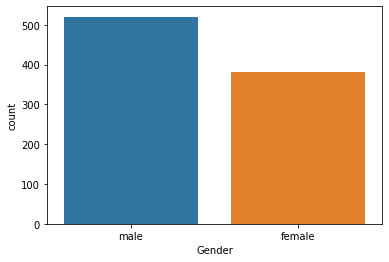

In [52]:
sns.countplot(data=data, x='Gender')

Through the bar graph, males are likely prone to get infected compared to female.

In [54]:
# A Function To Plot Pie Plot using Plotly

import plotly.graph_objs as go

def pie_plot(cnt_srs, colors, title):
    labels=cnt_srs.index
    values=cnt_srs.values
    trace = go.Pie(labels=labels, 
                   values=values, 
                   title=title, 
                   hoverinfo='percent+value', 
                   textinfo='percent',
                   textposition='inside',
                   hole=0.7,
                   showlegend=True,
                   marker=dict(colors=colors,
                               line=dict(color='#000000',
                                         width=2),
                              )
                  )
    return trace

In [55]:
dead = data[data.IsDeath == 1]
dead.sort_values(by=['agegrp'], inplace=True, ascending=True)
#dead.head()

In [56]:
fig=py.iplot([pie_plot(dead['agegrp'].value_counts().sort_values(ascending=False).head(10), ['seaborn'], 'Age of Dead person')])


Through the iplot, the age group of 61-70 are at higher end of the risk with a total death cases of 31% followed by 81-90 and least being 31-50 range with over 5% cases.

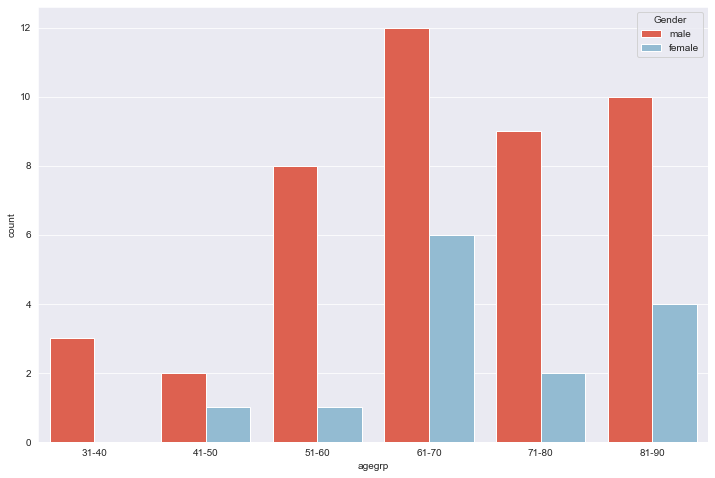

In [57]:
custom_palette = sns.color_palette("Reds")[3:4] + sns.color_palette("Blues")[2:5]

plt.figure(figsize=(12, 8))
sns.countplot(x = "agegrp",hue="Gender",palette=custom_palette,data=dead)

The bar graph shows the categorization of female and male and the total deaths for various age groups. Clearly, deaths in male is higher compared to female at every age group.
The age-group of 61-70 have maximum number of deaths in both male and female.

In [58]:
## The below csv files has travel history and infected cases in the areas of China, Korea and Mangolia.

In [59]:
# Libraries

import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import plotly.express as px
from datetime import date, timedelta
from sklearn.cluster import KMeans
import plotly.offline as py
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import statsmodels.api as sm
from sklearn.preprocessing import MinMaxScaler

In [60]:
#Reading Data

df_patient = pd.read_csv("C:/Users/ancna/OneDrive/Desktop/STATS_ML/patient.csv")
df_route = pd.read_csv("C:/Users/ancna/OneDrive/Desktop/STATS_ML/route.csv")

In [45]:
df_patient.shape

(5328, 14)

In [46]:
df_patient.isna().sum()

id                     0
sex                 4945
birth_year          4958
country                0
region              4957
group               5247
infection_reason    5188
infection_order     5293
infected_by         5258
contact_number      5281
confirmed_date         0
released_date       5296
deceased_date       5308
state                  0
dtype: int64

In [58]:
# Preprocessing

df_patient['birth_year'] = df_patient.birth_year.fillna(0.0).astype(int)
df_patient['birth_year'] = df_patient['birth_year'].map(lambda val: val if val > 0 else np.nan)
df_patient.confirmed_date = pd.to_datetime(df_patient.confirmed_date)
daily_count = df_patient.groupby(df_patient.confirmed_date).id.count()
accumulated_count = daily_count.cumsum()


Confirmed Cases

In [60]:
data = daily_count.resample('D').first().fillna(0).cumsum()
data = data[20:]
x = np.arange(len(data)).reshape(-1, 1)
y = data.values

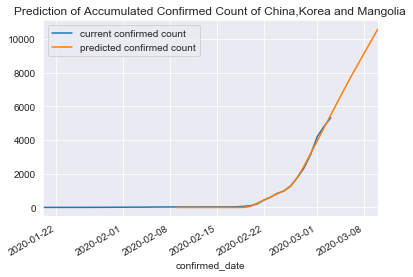

In [64]:
accumulated_count.plot()
predicted_count.plot()
plt.title('Prediction of Accumulated Confirmed Count of China,Korea and Mangolia')
plt.legend(['current confirmed count', 'predicted confirmed count'])
plt.show()

The trend analysis shows the rise of confirmed cases from 22nd February 2020 and the predicted confirmed count shows further rise in the future in the above areas. This is per the data available and can see potential raise if necessary precautions and restrictions are not applied on the respective countries.

In [71]:
df = pd.read_csv(r"C:/Users/ancna/OneDrive/Desktop/STATS_ML/Covid_CompleteList.csv")

In [19]:
df.columns

Index(['id', 'case_in_country', 'reporting date', 'summary', 'location',
       'country', 'gender', 'age', 'symptom_onset', 'If_onset_approximated',
       'hosp_visit_date', 'exposure_start', 'exposure_end', 'visiting Wuhan',
       'from Wuhan', 'death', 'recovered', 'symptom', 'source', 'link'],
      dtype='object')

In [20]:
#Remove columns which are not used in analysis
df.drop(['link','source','case_in_country','id','If_onset_approximated','summary','exposure_end'],axis=1,inplace=True)

In [21]:
df.columns

Index(['reporting date', 'location', 'country', 'gender', 'age',
       'symptom_onset', 'hosp_visit_date', 'exposure_start', 'visiting Wuhan',
       'from Wuhan', 'death', 'recovered', 'symptom'],
      dtype='object')

In [23]:
df['death'].isnull().sum()

0

According to dataset 0s are survival while 1s are death hence we fill NAs as 0s and dates as 1

In [24]:
df['death'].fillna(0, inplace=True)

In [25]:
#For the purpose of data cleaning in death column we first convert it into string
df['death'] = df['death'].astype(str)

In [26]:
df['death'].dtypes

dtype('O')

In [27]:
df['death'] = df['death'].replace(to_replace ='^2/.', value = '1', regex = True)

In [28]:
df['death'] = df['death'].replace(to_replace ='^[0-9]*/.', value = '1', regex = True) 

In [29]:
df['death'] = df['death'].replace(to_replace ='^[0-9]+.', value = '1', regex = True)

In [30]:
#Converting back to neumeric
pd.to_numeric(df['death'])

0       0
1       0
2       0
3       0
4       0
5       0
6       0
7       0
8       0
9       0
10      0
11      0
12      0
13      0
14      0
15      0
16      0
17      0
18      0
19      0
20      0
21      0
22      0
23      0
24      0
25      0
26      0
27      0
28      0
29      0
       ..
1055    0
1056    0
1057    0
1058    0
1059    0
1060    0
1061    0
1062    0
1063    0
1064    0
1065    0
1066    0
1067    0
1068    0
1069    0
1070    0
1071    0
1072    0
1073    0
1074    0
1075    0
1076    0
1077    0
1078    0
1079    0
1080    0
1081    0
1082    0
1083    0
1084    0
Name: death, Length: 1085, dtype: int64

In [54]:
df['death'] = df['death'].astype(int)

In [34]:
#Defining the function count plot
def count_plot(dataframe, column_name, title =None, hue = None):
    base_color = sns.color_palette()[0]
    sns.countplot(data = dataframe, x = column_name, hue=hue)
    plt.title(title)

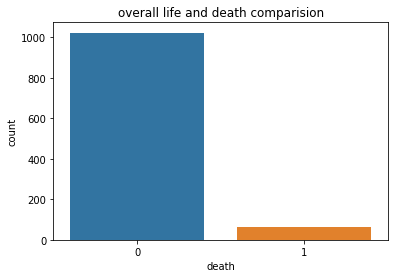

In [35]:
#Visualizing survived and death column
count_plot(df,"death","overall life and death comparision")

In [36]:
#Defining a simple bar plot function
def simple_bar_plot(data, title = None):
    data.plot("bar", title = title)

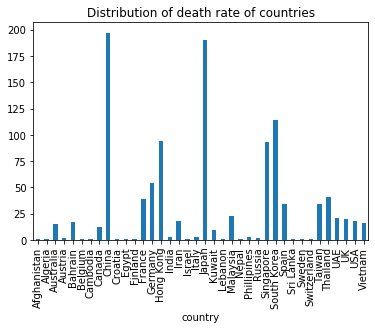

In [37]:
simple_bar_plot(df.groupby('country')['death'].count(), title = "Distribution of death rate of countries")

Now looking at the data we intend to make a Difference column which will have days a patient takes to visit hospital after exposure/infected by Covid 19

In [72]:
df['exposure_start'].dtypes

dtype('O')

In [73]:
#Converting it into proper date format first
df['exposure_start'] = pd.to_datetime(df['exposure_start'])

In [74]:
#Converting it into proper date format first
df['hosp_visit_date'] = pd.to_datetime(df['hosp_visit_date'])

In [75]:
#Even this so that we can merge symptom onset and exposure start to one
df['symptom_onset'] = pd.to_datetime(df['symptom_onset'])

In [76]:
#Placing null values of symptom_onset to exposure_start where null and then deleting the 'symptom_onset' column
df.exposure_start.fillna(df.symptom_onset, inplace=True)
del df['symptom_onset']

In [77]:
#Creating Difference column
df['Difference'] = df['hosp_visit_date'].sub(df['exposure_start'], axis=0)

In [78]:
#Converting Difference column to number column
df['Difference'] = df['Difference'] / np.timedelta64(1, 'D')

In [79]:
#Converting to neumeric
pd.to_numeric(df['Difference'])

0       13.0
1        0.0
2       13.0
3        NaN
4        NaN
5        NaN
6        NaN
7       10.0
8       11.0
9       12.0
10       8.0
11       7.0
12       NaN
13       NaN
14       NaN
15       NaN
16       NaN
17       8.0
18       6.0
19       5.0
20       NaN
21       0.0
22       8.0
23       NaN
24       NaN
25       NaN
26       NaN
27       0.0
28       NaN
29       NaN
        ... 
1055     NaN
1056     NaN
1057     NaN
1058     NaN
1059     NaN
1060     NaN
1061     NaN
1062     NaN
1063     NaN
1064     NaN
1065     NaN
1066     NaN
1067     NaN
1068     NaN
1069     NaN
1070     NaN
1071     NaN
1072     NaN
1073     NaN
1074     NaN
1075     NaN
1076     NaN
1077     NaN
1078     NaN
1079     NaN
1080     NaN
1081     NaN
1082     NaN
1083     NaN
1084     NaN
Name: Difference, Length: 1085, dtype: float64

In [80]:
df['Difference'].isnull().sum()

630

In [81]:
#Dropping null values from this column
df = df[pd.notnull(df['Difference'])]

In [82]:
df['Difference'].isnull().sum()

0

In [83]:
#Converting from float to integer
df['Difference'] = df['Difference'].astype(int)

In [55]:
#Cleaning and processing of symptom column
df['symptom'].dtypes

dtype('O')

In [56]:
df['symptom'].isnull().sum()

253

In [57]:
#Replacing null by unknown
df['symptom'].fillna('unknown', inplace=True)

In [58]:
df['symptom'].isnull().sum()

0

In [59]:
#Cleaning of symptom column using Regex
df['symptom'] = df['symptom'].replace(to_replace ='feaver', value = 'fever', regex = True)

In [60]:
df['symptom'] = df['symptom'].replace(to_replace ='^f.*\$', value = 'fever', regex = True)

In [61]:
df['symptom'].value_counts()

unknown                                                        253
fever                                                           63
fever, cough                                                    28
cough                                                            9
fever, sore throat                                               5
fever, malaise                                                   5
fever, cough, malaise                                            4
cough, shortness of breath                                       3
fever, cough, headache                                           3
fever, runny nose                                                2
cough, fever                                                     2
fever, cough, sore throat                                        2
fatigue, fever                                                   2
cough, malaise                                                   2
cold, fever, pneumonia                                        

In [62]:
#Since there are a lot of unknown values hence first removing unknown values and then visualizing top symtomps of COVID19
df1 = df[df.symptom != 'unknown']

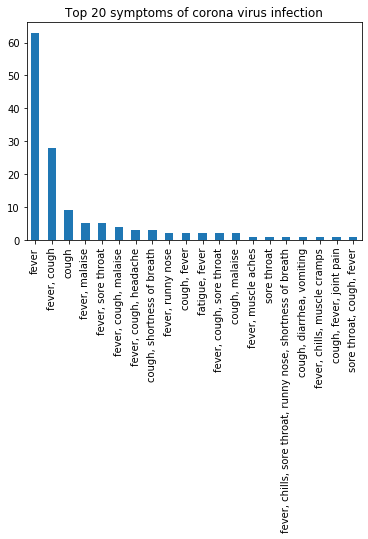

In [64]:
#df1['symptom'].value_counts()
simple_bar_plot(df1["symptom"].value_counts(sort=True)[:20], 
                title = "Top 20 symptoms of corona virus infection")

We saw that according to our dataset fever, cough and shortness of breath are the main symptoms of COVID-19 infection

In [75]:
df['gender'].isnull().sum()

1

In [76]:
df = df[pd.notnull(df['gender'])]

In [77]:
df['gender'].isnull().sum()

0

In [84]:
df['age'].isnull().sum()

11

In [85]:
df = df[pd.notnull(df['age'])]

In [86]:
df['age'].isnull().sum()

0

In [87]:
df['age'].astype(int)

0       66
1       56
2       46
7       37
8       39
9       56
10      18
11      32
17      52
18      33
19      40
21      51
27      66
35      45
41      63
42      62
43      49
48      61
49      69
51      89
52      66
53      75
55      82
56      66
57      81
59      65
60      80
62      86
64      84
66      40
        ..
924     70
927     69
928     45
929     46
934     68
935     70
936     75
937     38
938     58
939     48
940     96
941     68
942     62
943     80
944     76
945     35
946     57
947     68
955     60
956     49
957     21
958     16
959     80
960     29
961     26
962     70
963     89
992     44
995     32
1000    36
Name: age, Length: 444, dtype: int32

# Machine Learning

### Random Forest model
    We decided to use 'age', 'Difference', 'Gender' columns to predict the chances of survival or death for a infected 
    person.We decided to Random Forest Model because is a meta estimator that fits a number of decision tree classifiers on
    various sub-samples of the dataset and uses averaging to improve the predictive accuracy and control over-fitting.And
    also it is a Multiclass Classifier hence using predict_proba method which is very efficient and cheks for probabilty
    of each class

In [88]:
# Changing the values of male and female neumeric to put in the model
df.gender[df.gender == 'male'] = 1
df.gender[df.gender == 'female'] = 2

In [90]:
#Defining X and Y
X = df[['age', 'Difference', 'gender']]
Y = df['death']

In [91]:
from sklearn.model_selection import train_test_split
X_Train, X_Test, Y_Train, Y_Test = train_test_split(X, Y, test_size = 0.25, random_state = 0)

In [92]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(random_state=100)

### Cross Validation:
       Evaluating a classifier is more complicated than evaluating a regressor
       (t-test, F-test, etc.). One way to evaluate a model is to use
        cross-validation. Cross-validation is when you break up the training data
        into di↵erent subsets, called K-folds. For example, when K=3, the
        training data will be broken into 3 subsets.Then the model is trained and
        tested 3 times (K times). In each iteration of training and testing, 1 subset
        is chosen to be the test set, while the other 2 are used to train the model.

In [93]:
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import cross_val_score
forest_scores=cross_val_predict(rfc,X_Train,Y_Train,cv=3,method='predict_proba')
forest_scores[0]
#The predict proba method returns a probability that each image

array([0.32, 0.68])

The 0.32 represents that the classifier says with 32% probability that the first class is 1, and the 0.68 represents 68% probability of it being in the 0 class. Therefore, the model says it is 0.

In [94]:
Y.iloc[0:1]

0    0
Name: death, dtype: int32

When we check manually it gives us 0 as well hence our model is correct in predicting

In [95]:
#For checking accuracy in rfc
from sklearn.model_selection import cross_val_score
cross_val_score(rfc,X_Train,Y_Train,cv=3,scoring='accuracy')

array([0.92792793, 0.9009009 , 0.9009009 ])

We can see the accuracy is pretty good in all the three folds of validation!

    But forest score are probabilities not scores, a simple solution is to use the
    positive class’s (1s) probability as the score. We will use the same in a later point in below and find out 
    rc_auc score, precision, recall

In [101]:
rfc.fit(X_Train,Y_Train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=100,
                       verbose=0, warm_start=False)

In [102]:
Y_Pred = rfc.predict(X_Test)

In [106]:
Y_Pred

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0])

    In case of a skewed dataset, meaning there are some
    classes that are much more frequent than others for example :  There maybe a lot more survivals (0s) then deaths (1)
    In such cases confusion matrix is better then cv to check for accuracy

In [142]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(Y_Test, Y_Pred)
cm

array([[95,  5],
       [ 8,  3]], dtype=int64)

In [110]:
from sklearn.metrics import roc_auc_score

roc_auc_score(Y_Train,forest_scores[:,1])

0.8569958847736625

Our roc_auc score is pretty good!

In [111]:
Y_Pred1=cross_val_predict(rfc,X_Train,Y_Train,cv=3) #Finding y prediction through cross validation

### Precision 
    It is the accuracy of the positive predictions of a certain class. . In
    the case of our analysis, we will calculate the precision of our classifier in
    positively identifying both 0s (deaths) and survivals(1s). For example, for the ones
    predicted to be 1, how many were actually 1.

### Recall
     It also called sensitivity or true positive rate (TPR), is the ratio of
     positive instances that are correctly detected by the classifier.

In [150]:
#Finding precision score
from sklearn.metrics import precision_score
precision_score(Y_Train ,Y_Pred1)

0.44

In [152]:
#Finding recall score
from sklearn.metrics import recall_score
recall_score(Y_Train ,Y_Pred1)

0.4074074074074074

In [153]:
#Find precision recalls threshold and plotting them
from sklearn.metrics import precision_recall_curve 
precisions, recalls, thresholds = precision_recall_curve(Y_Train, Y_Pred1)

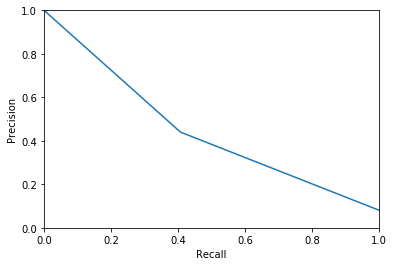

In [154]:
plt.plot(recalls,precisions)
plt.xlabel('Recall') 
plt.ylabel('Precision')
plt.ylim([0 ,1])
plt.xlim([0 ,1])
plt.show()

In [ ]:
#From above plot we could see that Recall could be higher when Precision is less then 40%

    We use a measure that combines precision and recall into a single variable
    called the F1 score, which is a harmonic mean. A harmonic mean gives
    more weight to lower values, as a result a classifier can only get a high
    score if both values are high.

In [155]:
from sklearn.metrics import f1_score 
f1_score(Y_Train ,Y_Pred1)

0.4230769230769231

We see our F1 score is 42 % which is distributed on both precesion and recall

In [169]:
threshold_40=thresholds[recalls[:-1]>=.4].max()
threshold_40
#We find the threshold for recall since in our model recall is more important then precesion and the curve falls at 40%

1

### K means clustering

In [92]:
%matplotlib inline
from copy import deepcopy
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = (20, 12)
plt.style.use('ggplot')

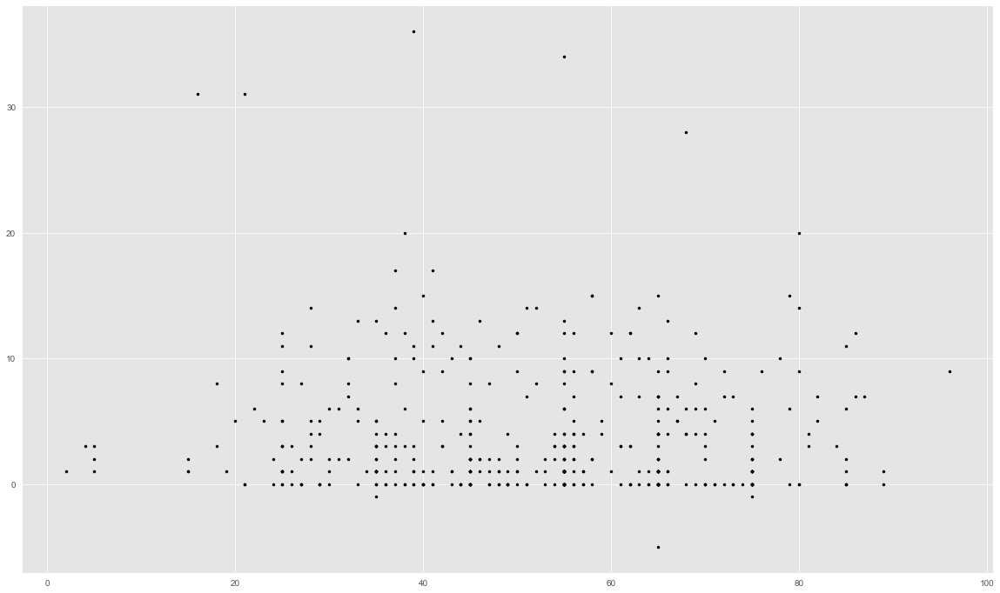

In [94]:
f2 = df['age'].values
f1 = df['Difference'].values
X = np.array(list(zip(f1, f2)))
plt.scatter(f2, f1, c='black', s=9)

In [172]:
# Euclidean Distance Caculator
def dist(a, b, ax=1):
    return np.linalg.norm(a - b, axis=ax)

In [173]:
# Number of clusters
k = 3
# X coordinates of random centroids
C_x = np.random.randint(0, np.max(X)-20, size=k)
# Y coordinates of random centroids
C_y = np.random.randint(0, np.max(X)-20, size=k)
C = np.array(list(zip(C_x, C_y)), dtype=np.float32)
print(C)

[[34. 22.]
 [57.  9.]
 [50. 35.]]


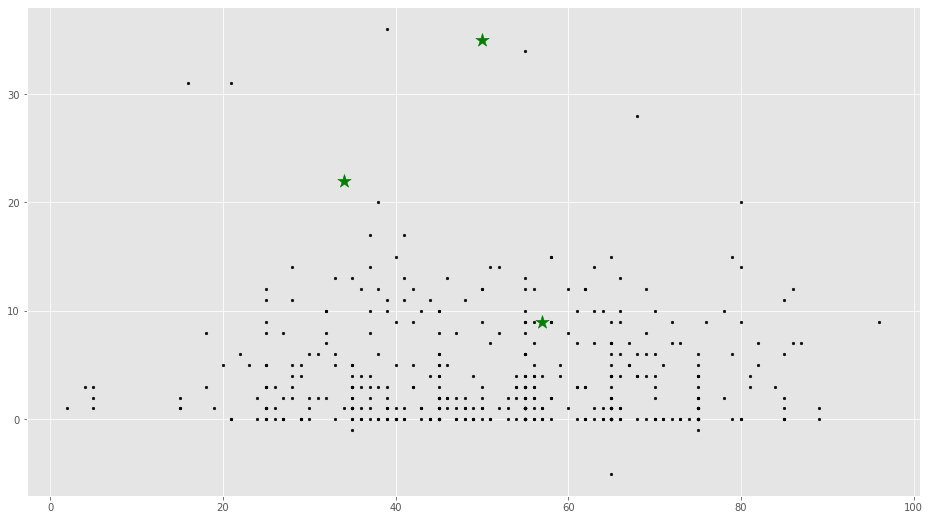

In [174]:
# Plotting along with the Centroids
plt.scatter(f1, f2, c='#050505', s=7)
plt.scatter(C_x, C_y, marker='*', s=200, c='g')

The green stars depicts random postion of the centroids before start of K- means clustering

In [175]:
# To store the value of centroids when it updates
C_old = np.zeros(C.shape)
# Cluster Lables(0, 1, 2)
clusters = np.zeros(len(X))
# Error func. - Distance between new centroids and old centroids
error = dist(C, C_old, None)
# Loop will run till the error becomes zero
while error != 0:
    # Assigning each value to its closest cluster
    for i in range(len(X)):
        distances = dist(X[i], C)
        cluster = np.argmin(distances)
        clusters[i] = cluster
    # Storing the old centroid values
    C_old = deepcopy(C)
    # Finding the new centroids by taking the average value
    for i in range(k):
        points = [X[j] for j in range(len(X)) if clusters[j] == i]
        C[i] = np.mean(points, axis=0)
    error = dist(C, C_old, None)

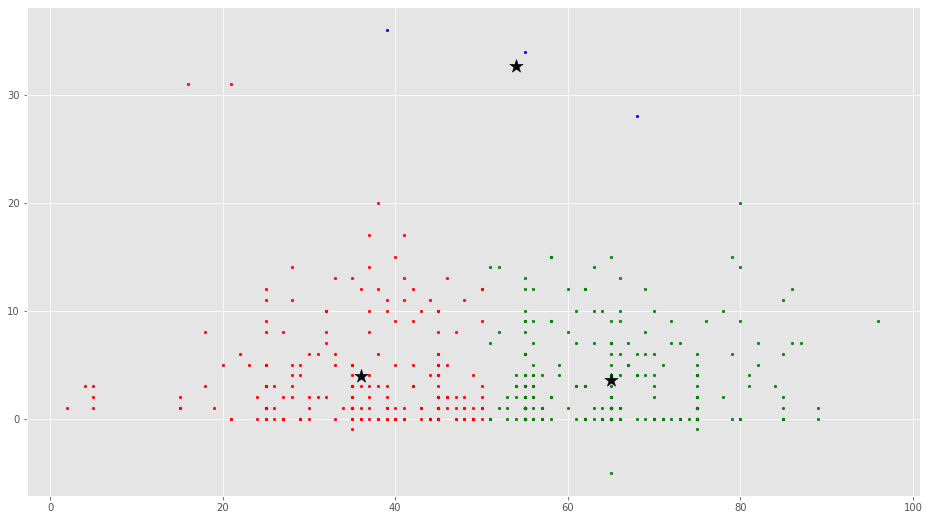

In [176]:
colors = ['r', 'g', 'b', 'y', 'c', 'm']
fig, ax = plt.subplots()
for i in range(k):
        points = np.array([X[j] for j in range(len(X)) if clusters[j] == i])
        ax.scatter(points[:, 0], points[:, 1], s=7, c=colors[i])
ax.scatter(C[:, 0], C[:, 1], marker='*', s=200, c='#050505')

# Forecasting

### Holt’s Linear Trend Model: 
        This method takes into account the trend of the dataset. By trend, 
        we mean the increasing or decreasing nature of the series. Suppose the number of bookings in a hotel 
        increases every year, then we can say that the number of bookings show an increasing trend. The forecast
        function in this method is a function of level and trend.

This is one more dataset which contains all the confirmed cases world wide and is much resourceful for forecasting

In [190]:
df9 = pd.read_csv(r"C:/Users/ancna/OneDrive/Desktop/STATS_ML/covid_19_data.csv")

    Since New York is next target of whole world and it is highly diversed hence we will forecast the infection
    rate in New York and we will first try with Holt;s Linear Trend because we see a increasing trend in New York as of now

In [191]:
US = df9[df9['Province/State'] == "New York"]

In [192]:
df9.columns

Index(['SNo', 'ObservationDate', 'Province/State', 'Country/Region',
       'Last Update', 'Confirmed', 'Deaths', 'Recovered'],
      dtype='object')

In [194]:
#We are only taking taking the time series univarite data of date and confimed cases
df10 = US[['ObservationDate','Confirmed']]

In [195]:
df10 = df10.set_index('ObservationDate')

In [196]:
prophet= pd.DataFrame(df10)

In [197]:
df10.head()

,Confirmed
ObservationDate,
03/10/2020,173.0
03/11/2020,220.0
03/12/2020,328.0
03/13/2020,421.0
03/14/2020,525.0


In [198]:
df10.tail() # Confirming it is a time series data

,Confirmed
ObservationDate,
04/20/2020,253060.0
04/21/2020,258361.0
04/22/2020,263292.0
04/23/2020,263460.0
04/24/2020,271590.0


In [199]:
df10.dtypes

Confirmed    float64
dtype: object

In [201]:
#Preparing train and test data
model_train=df10.iloc[:int(df10.shape[0]*0.90)]
valid=df10.iloc[int(df10.shape[0]*0.90):]

In [202]:
from statsmodels.tsa.api import Holt,SimpleExpSmoothing,ExponentialSmoothing
model_scores=[]
holt=Holt(np.asarray(model_train["Confirmed"])).fit(smoothing_level=0.3, smoothing_slope=0.4)
y_pred=valid.copy()

In [203]:
y_pred["Holt"]=holt.forecast(len(valid))
model_scores.append(np.sqrt(mean_squared_error(y_pred["Confirmed"],y_pred["Holt"])))
print("Root Mean Square Error Holt's Linear Model: ",np.sqrt(mean_squared_error(y_pred["Confirmed"],y_pred["Holt"])))

Root Mean Square Error Holt's Linear Model:  13357.415287112612


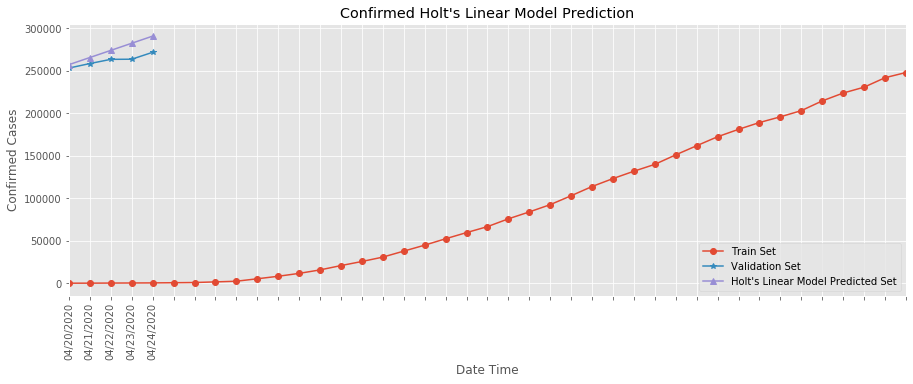

In [204]:
plt.figure(figsize=(15,5))
plt.plot(model_train.Confirmed,label="Train Set",marker='o')
valid.Confirmed.plot(label="Validation Set",marker='*')
y_pred.Holt.plot(label="Holt's Linear Model Predicted Set",marker='^')
plt.ylabel("Confirmed Cases")
plt.xlabel("Date Time")
plt.title("Confirmed Holt's Linear Model Prediction")
plt.xticks(rotation=90)
plt.legend()

We could see our model is predicting pretty well. However let us try ARIMA model considering it might not have trend as well. But we have to convert time series data into stationary data for the same

### ARIMA model
        ARIMA is a very popular technique for time series modeling. It describes the correlation between data 
        points and takes into account the difference of the values

        The data series is stationary, which means that the mean and variance should not vary with time. 
        A series can be made stationary by using log transformation or differencing the series.

        The data provided as input must be a univariate series, since arima uses the past values to predict 
        the future values.


        ARIMA models provide another approach to time series forecasting.
        Exponential smoothing and ARIMA models are the two most widelyused approaches to time series forecasting,
        and provide complementary approaches to the problem

        While exponential smoothing models are based on a description of
        trend and seasonality in the data, ARIMA models aim to describe the
        autocorrelations in the data and we use ARIMA considering in COVID 19 no seasonality 
        and trend as well

        We tend to convert the data into stationary which makes prediction of future values easy
        a stationary time series is one whose properties do not depend on the time at which the series is observed

In [206]:
confirm_cs = prophet.cumsum()
arima_data = confirm_cs.reset_index()
arima_data.columns = ['ObservationDate','Confirmed']

    We used order of (0,1,0) because it is a special case of ARIMA that
    is random walk model and we use random walk because covid 19 data 
    is data with stochastic trends and A random walk often provides a good fit to it.
    The forecasts from a random walk model are equal to the last
    observation, as future movements are unpredictable, and are
    equally likely to be up or down. Thus, the random walk model
    underpins naïve forecasts.

In [207]:
model = ARIMA(arima_data['Confirmed'].values, order=(0,1,0)) 
fit_model = model.fit(trend='c', full_output=True, disp=True)
fit_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:                    D.y   No. Observations:                   45
Model:                 ARIMA(0, 1, 0)   Log Likelihood                -579.460
Method:                           css   S.D. of innovations          94651.746
Date:                Sun, 26 Apr 2020   AIC                           1162.921
Time:                        22:22:23   BIC                           1166.534
Sample:                             1   HQIC                          1164.268
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1.105e+05   1.41e+04      7.833      0.000    8.29e+04    1.38e+05
==============================================================================
"""

    Akaike’s Information Criterion (AIC): It should be smaller.  The Akaike Information Critera (AIC) is a widely 
    used measure of a statistical model. It basically quantifies 1) the goodness of fit, and 2) the simplicity/parsimony,
    of the model into a single statistic. When comparing two models, the one with the lower AIC is generally “better”.
    But since we used auto_arima so it is in best form


    BIC Bayesian Information Criterion: It should be smallest. The BIC resolves this problem by introducing a penalty 
    term for the number of parameters in the model. The penalty term is large in BIC than in AIC.

    Good models are obtained by minimizing either the AIC, AICc or BIC

We tend to use auto arima for best values of p and q and hence we need to install pmdarima


In [97]:
#pip install pmdarima

In [210]:
import pmdarima
from pmdarima import auto_arima #Make series stationary, Determine d value,Create ACF and PACF plots for determining parameters, 
#Determine the p and q values
import warnings 
warnings.filterwarnings("ignore") 
stepwise_fit = auto_arima(arima_data['Confirmed'], start_p = 1, start_q = 1, # The auto_arima helps us in Selecting appropriate values for p, d and q for the best model
                          max_p = 3, max_q = 3, m = 12, 
                          start_P = 0, seasonal = True, 
                          d = None, D = 1, trace = True, 
                          error_action ='ignore',   # we don't want to know if an order does not work 
                          suppress_warnings = True,  # we don't want convergence warnings 
                          stepwise = True)
stepwise_fit.summary()

Performing stepwise search to minimize aic
Fit ARIMA: (1, 2, 1)x(0, 1, 1, 12) (constant=True); AIC=592.843, BIC=600.172, Time=1.050 seconds
Fit ARIMA: (0, 2, 0)x(0, 1, 0, 12) (constant=True); AIC=630.270, BIC=633.201, Time=0.011 seconds
Fit ARIMA: (1, 2, 0)x(1, 1, 0, 12) (constant=True); AIC=593.876, BIC=599.739, Time=0.680 seconds
Fit ARIMA: (0, 2, 1)x(0, 1, 1, 12) (constant=True); AIC=604.944, BIC=610.807, Time=1.119 seconds
Near non-invertible roots for order (0, 2, 1)(0, 1, 1, 12); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 2, 0)x(0, 1, 0, 12) (constant=False); AIC=634.181, BIC=635.647, Time=0.022 seconds
Fit ARIMA: (1, 2, 1)x(0, 1, 0, 12) (constant=True); AIC=593.442, BIC=599.305, Time=0.379 seconds
Fit ARIMA: (1, 2, 1)x(1, 1, 1, 12) (constant=True); AIC=595.288, BIC=604.082, Time=1.295 seconds
Fit ARIMA: (1, 2, 1)x(0, 1, 2, 12) (constant=True); AIC=594.629, BIC=603.423, Time=2.867 seconds
Fit ARIMA: (1, 2, 1)x

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                                    y   No. Observations:                   46
Model:             SARIMAX(2, 2, 0)x(0, 1, [1], 12)   Log Likelihood                -291.277
Date:                              Sun, 26 Apr 2020   AIC                            592.554
Time:                                      22:25:25   BIC                            599.882
Sample:                                           0   HQIC                           594.983
                                               - 46                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept    197.4792    265.287      0.744      0.457    -322.474     717.432
ar.L1          0.5448      0.150      3.632      0.000       0.251       0.839
ar.L2          0.3410      0.197      1.730      0.084      -0.045       0.727
ma.S.L12      -0.7651      0.390     -1.960      0.050      -1.530   -9.21e-05
sigma2      4.208e+06      0.019   2.18e+08      0.000    4.21e+06    4.21e+06
===================================================================================
Ljung-Box (Q):                       16.74   Jarque-Bera (JB):                 0.02
Prob(Q):                              0.98   Prob(JB):                         0.99
Heteroskedasticity (H):               8.20   Skew:                            -0.06
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.03
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.14e+24. Standard errors may be unstable.
"""

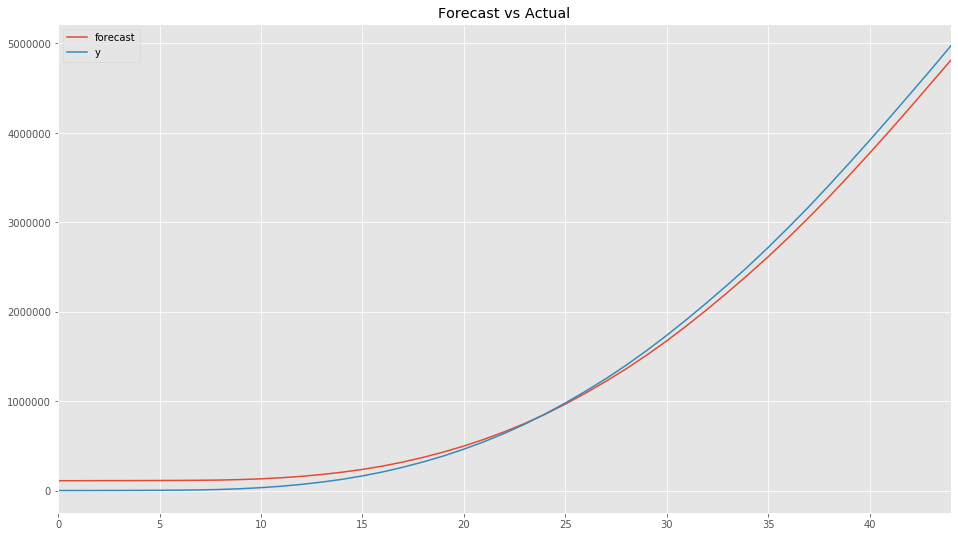

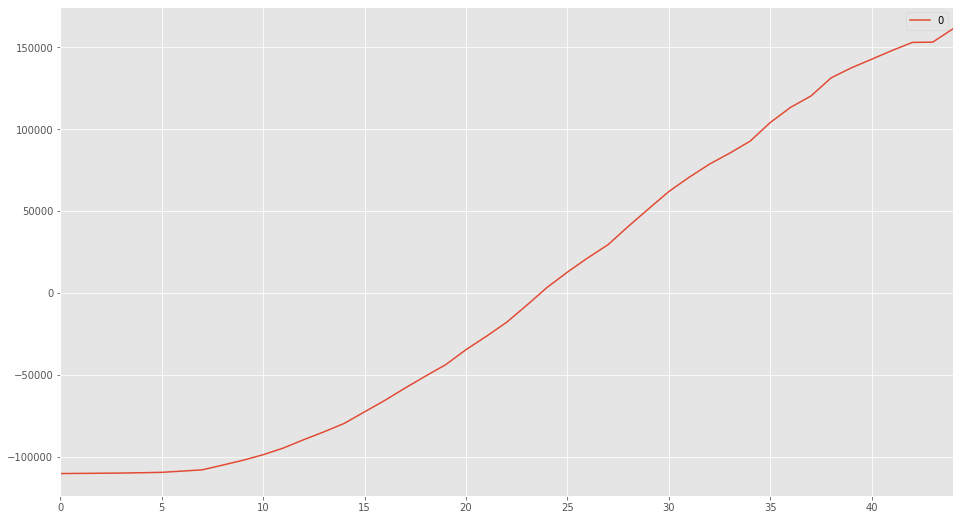

In [211]:
fit_model.plot_predict()
plt.title('Forecast vs Actual')
pd.DataFrame(fit_model.resid).plot()

### Concept behind forecasting future values
    Assuming we have observations up to time T, all values 
    are known except for eT+1 which we replace by zero and eT
    which we replace by the last observed residual eT

    A forecast of yT+2 is obtained by replacing t by T+2

    The process continues in this manner for all future time periods. 
    Hence, in this way, any number of point forecasts can be obtained.

In [212]:
forcast = fit_model.forecast(steps=46)
pred_y = forcast[1].tolist()
pd.DataFrame(pred_y)

,0
0,94651.746430
1,133857.783504
2,163941.633842
3,189303.492860
4,211647.739207
5,231848.482017
6,250424.982212
7,267715.567008
8,283955.239291
9,299315.103232


In [213]:
#calculate rmse
from math import sqrt
from sklearn.metrics import mean_squared_error

rms = sqrt(mean_squared_error(arima_data['Confirmed'],pred_y))
print(rms)

1644441.889165488


### Conclusion
    1) From our analysis and EDA we identified USA would be the most affected country trending in larger number
    of confirmed and death cases in current situation followed by European countries.
    2) Through the RFC model we see that though death count is low at the moment but it would potentially increase 
    in future without necessary steps and age, gender, getting medical attention are not the only attributes to 
    be considered for survival and we could improve our model by maximizing recall.
    3) From both Holts Linear Trend and ARIMA model we could forecast increasing number of cases. But HOLTS Linear 
    Trend model is better for forecasting in COVID 19 case since we could see an increasing trend and fluctuations
    are irrevalent and the same could be endrosed by rmse values of both the models.  
    4)From our K means clustering we found that age group of 20-50 and 50-100 takes around maximum of 20 days
    ( with maximum people in the group of 50-100)  to seriously fall ill which is described by
     Difference between infected date and hospital visit date. And also there is one more group which takes more then
     30 days and is diversed from the prospect of age.

### References:
    1) John Hopkins Git repository: https://github.com/CSSEGISandData/COVID-19
    2)https://www.cdc.gov/coronavirus/2019-ncov/index.html
    3)https://www.analyticsvidhya.com/blog/2018/08/auto-arima-time-series-modeling-python-r/

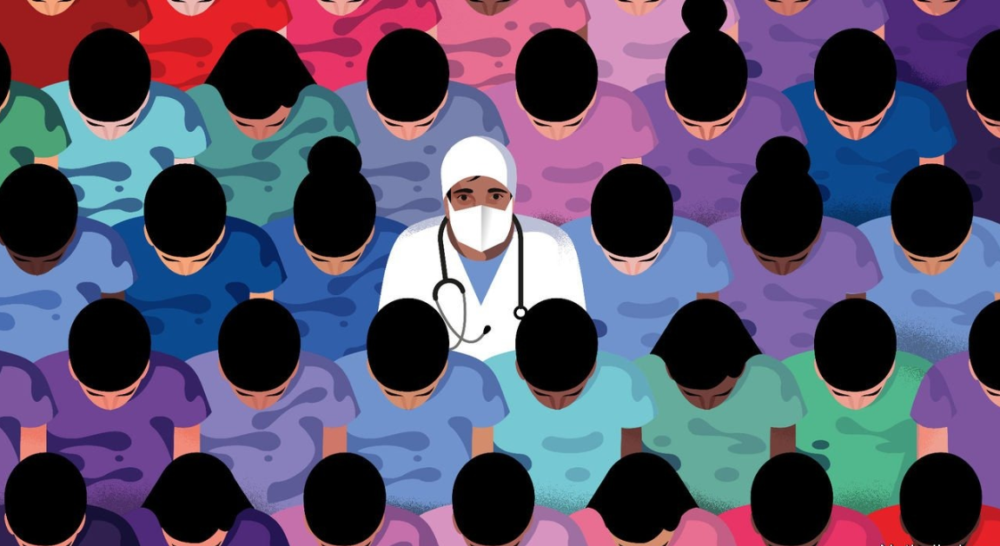

In [96]:
from IPython.display import Image
Image("End.png")